In [20]:
%load_ext autoreload
%autoreload 2

from pathlib import Path

from hloc import extract_features, match_features, reconstruction, visualization

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Setup
In this notebook, we will run SfM reconstruction from scratch on a set of images. We choose the Argoverse - we will download it later. First, we define some paths.

In [21]:
dataset = Path('/home/cloudlet/datasets/argoverse-tracking/train1/test_1015')
images = dataset / 'db_query/'

pairs = Path('pairs/argo_1015/')
sfm_pairs = pairs / 'pairs40_argo_db.txt'  # top 20 retrieved by NetVLAD
loc_pairs = pairs / 'pairs40_argo_query.txt'  # top 20 retrieved by NetVLAD

outputs = Path('outputs/argo_1015_retrieved/')
# sfm_pairs = outputs / 'pairs-exhaustive.txt'  # exhaustive matching
sfm_dir = outputs / 'sfm_1015'

feature_conf = extract_features.confs['superpoint_aachen']
matcher_conf = match_features.confs['superglue']

features = feature_conf['output']
feature_file = f"{features}.h5"
match_file = f"{features}_{matcher_conf['output']}_{sfm_pairs.stem}.h5"
match_file_query = f"{features}_{matcher_conf['output']}_{loc_pairs.stem}.h5"

## Extract local features

In [5]:
extract_features.main(feature_conf, images, outputs)

[10/15/2020 11:36:55 INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'feats-superpoint-n4096-r1024',
 'preprocessing': {'grayscale': True, 'resize_max': 1024}}
Loaded SuperPoint model
[10/15/2020 11:36:59 INFO] Found 2972 images in root /home/cloudlet/datasets/argoverse-tracking/train1/test_1015/db_query.


  0%|          | 0/2972 [00:00<?, ?it/s]/home/cloudlet/work/Hierarchical-Localization/hloc/extractors/../../third_party/SuperGluePretrainedNetwork/models/superpoint.py:172: UserWarning: This overload of nonzero is deprecated:
	nonzero(Tensor input, *, Tensor out)
Consider using one of the following signatures instead:
	nonzero(Tensor input, *, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  for s in scores]
100%|██████████| 2972/2972 [00:51<00:00, 58.08it/s]

[10/15/2020 11:37:50 INFO] Finished exporting features.


## Matching using NetVLAD pairs and SuperGlue Model (Top40)

In [6]:
match_features.main(matcher_conf, sfm_pairs, features, outputs)

[10/15/2020 11:38:19 INFO] Matching local features with configuration:
{'model': {'name': 'superglue',
           'sinkhorn_iterations': 50,
           'weights': 'outdoor'},
 'output': 'matches-superglue'}
cuda


  0%|          | 1/93800 [00:00<3:36:36,  7.22it/s]

Loaded SuperGlue model ("outdoor" weights)


100%|██████████| 93800/93800 [1:17:33<00:00, 20.16it/s]

[10/15/2020 12:55:53 INFO] Finished exporting matches.


## SfM reconstruction
Run COLMAP on the features and matches.

In [3]:
reconstruction.main(
    sfm_dir,
    images,
    sfm_pairs,
    outputs / feature_file,
    outputs / match_file)

[10/16/2020 13:04:33 INFO] Creating an empty database...
[10/16/2020 13:04:33 INFO] Importing images into the database...
[10/16/2020 13:05:25 INFO] Importing features into the database...


100%|██████████| 2972/2972 [00:03<00:00, 968.55it/s] 


[10/16/2020 13:05:29 INFO] Importing matches into the database...


100%|██████████| 93800/93800 [00:28<00:00, 3243.98it/s]


[10/16/2020 13:06:03 INFO] Performing geometric verification of the matches...
[10/16/2020 13:06:48 INFO] Running the 3D reconstruction...
[10/16/2020 13:06:48 INFO] colmap mapper --database_path outputs/argo_1015_retrieved/sfm_1015/database.db --image_path /home/cloudlet/datasets/argoverse-tracking/train1/test_1015/db_query --output_path outputs/argo_1015_retrieved/sfm_1015/models --Mapper.num_threads 32
[10/16/2020 21:22:13 INFO] Reconstructed 3 models.
[10/16/2020 21:22:13 INFO] Largest model is #0 with {largest_model_num_images} images.
[10/16/2020 21:22:13 INFO] Statistics:
{'mean_reproj_error': 1.395143,
 'mean_track_length': 47.546473,
 'num_input_images': 2972,
 'num_observations': 708490,
 'num_observations_per_image': 1510.639659,
 'num_reg_images': 469,
 'num_sparse_points': 14901}


In [24]:
sfm_dir2 = outputs / 'sfm_hierarchical'
images_db = dataset / 'db/'
reconstruction.main(
    sfm_dir2,
    images_db,
    sfm_pairs,
    outputs / feature_file,
    outputs / match_file,
    hierarchical=True)

[10/17/2020 00:32:34 INFO] Creating an empty database...
[10/17/2020 00:32:34 INFO] Importing images into the database...
[10/17/2020 00:33:13 INFO] Importing features into the database...


100%|██████████| 2345/2345 [00:00<00:00, 2860.84it/s]


[10/17/2020 00:33:14 INFO] Importing matches into the database...


100%|██████████| 93800/93800 [00:25<00:00, 3658.13it/s]


[10/17/2020 00:33:45 INFO] Performing geometric verification of the matches...
[10/17/2020 00:34:45 INFO] Running the 3D reconstruction...
[10/17/2020 00:34:45 INFO] colmap hierarchical_mapper --database_path outputs/argo_1015_retrieved/sfm_hierarchical/database.db --image_path /home/cloudlet/datasets/argoverse-tracking/train1/test_1015/db --output_path outputs/argo_1015_retrieved/sfm_hierarchical/models --Mapper.num_threads 16


KeyboardInterrupt: 

## Rescale the model based on the ground truth position of db images

In [5]:
import os
output_dir = '/home/cloudlet/work/Hierarchical-Localization/outputs/argo_1015_retrieved/sfm_1015/models/model_aligned/'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
cmd = 'colmap model_aligner \
    --input_path /home/cloudlet/work/Hierarchical-Localization/outputs/argo_1015_retrieved/sfm_1015/models/0/ \
    --output_path ' + output_dir + '\
    --ref_images_path /home/cloudlet/datasets/argoverse-tracking/train1/test_1015/db_location_1015.txt \
    --robust_alignment_max_error 0.5'
os.system(cmd)

0

## Match the query images
Do feature matching for the query images.

In [3]:
match_features.main(matcher_conf, loc_pairs, features, outputs)

[10/15/2020 19:41:48 INFO] Matching local features with configuration:
{'model': {'name': 'superglue',
           'sinkhorn_iterations': 50,
           'weights': 'outdoor'},
 'output': 'matches-superglue'}
cuda
Loaded SuperGlue model ("outdoor" weights)


100%|██████████| 25080/25080 [35:09<00:00, 11.89it/s]

[10/15/2020 20:17:03 INFO] Finished exporting matches.


## Localize!
Perform hierarchical localization using the precomputed retrieval and matches.

In [7]:
from hloc import localize_sfm
# RING_IMG_WIDTH = 1920
# RING_IMG_HEIGHT = 1200
results = outputs / 'argo_1015_superpoint+superglue_netvlad40.txt'  # the result file

localize_sfm.main(
    sfm_dir / 'models/model_aligned/',
    dataset / 'queries_with_intrinsics_1015.txt',
    loc_pairs,
    outputs / f"{feature_conf['output']}.h5",
    outputs / f"{feature_conf['output']}_{matcher_conf['output']}_{loc_pairs.stem}.h5",
    results,
    covisibility_clustering=False)  # not required with SuperPoint+SuperGlue

[10/16/2020 22:34:05 INFO] Importing 627 queries in queries_with_intrinsics_1015.txt
[10/16/2020 22:34:05 INFO] Reading 3D model...
469
[10/16/2020 22:34:06 INFO] Starting localization...


  0%|          | 0/627 [00:00<?, ?it/s]

[10/16/2020 22:34:06 WARNING] Image ring_front_center_315967473228664592.jpg was retrieved but not in database
[10/16/2020 22:34:06 WARNING] Image ring_front_center_315967472862366520.jpg was retrieved but not in database
[10/16/2020 22:34:06 WARNING] Image ring_front_center_315967473261964496.jpg was retrieved but not in database
[10/16/2020 22:34:06 WARNING] Image ring_front_center_315967481054169272.jpg was retrieved but not in database
[10/16/2020 22:34:06 WARNING] Image ring_front_center_315967473395163704.jpg was retrieved but not in database
[10/16/2020 22:34:06 WARNING] Image ring_front_center_315967472895666424.jpg was retrieved but not in database
[10/16/2020 22:34:06 WARNING] Image ring_front_center_315967473095465384.jpg was retrieved but not in database
[10/16/2020 22:34:06 WARNING] Image ring_front_center_315967472962266040.jpg was retrieved but not in database
[10/16/2020 22:34:06 WARNING] Image ring_front_center_315967473028865712.jpg was retrieved but not in database
[

  0%|          | 0/627 [00:00<?, ?it/s]

[]
{1407: Image(id=1407, qvec=array([0.63347307, 0.17551237, 0.34718107, 0.66885916]), tvec=array([ 2111.63947386,   137.68399671, -2065.56713697]), camera_id=1407, name='ring_front_right_315967482619270600.jpg', xys=array([[1457.8125,   15.9375],
       [1862.8125,   15.9375],
       [1890.9375,   15.9375],
       ...,
       [1122.1875, 1182.1875],
       [1067.8125, 1184.0625],
       [1277.8125, 1184.0625]]), point3D_ids=array([   -1,    -1,    -1, ..., 22865, 23314,    -1])), 1406: Image(id=1406, qvec=array([0.63352142, 0.17542474, 0.34721321, 0.66881967]), tvec=array([ 2111.75120655,   137.1835346 , -2065.30062251]), camera_id=1406, name='ring_front_right_315967482585970440.jpg', xys=array([[1500.9375,   15.9375],
       [1508.4375,   15.9375],
       [1542.1875,   15.9375],
       ...,
       [ 754.6875, 1182.1875],
       [ 321.5625, 1184.0625],
       [1330.3125, 1184.0625]]), point3D_ids=array([   -1, 20113,    -1, ...,    -1, 24128,  1657])), 1405: Image(id=1405, qvec=array(

IndexError: list index out of range

## Visualization
We visualize some of the registered images, and color their keypoint by visibility, track length, or triangulated depth.

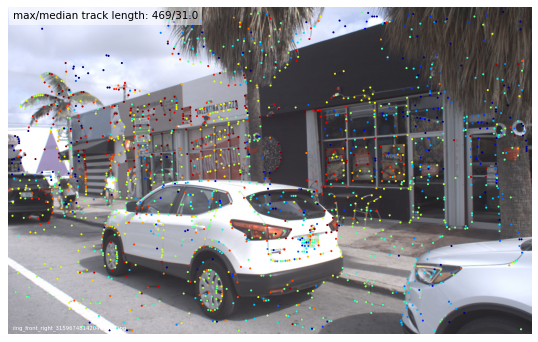

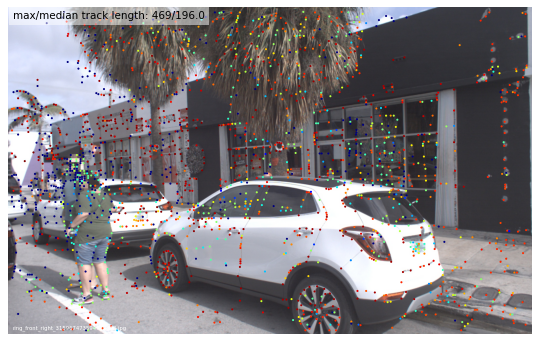

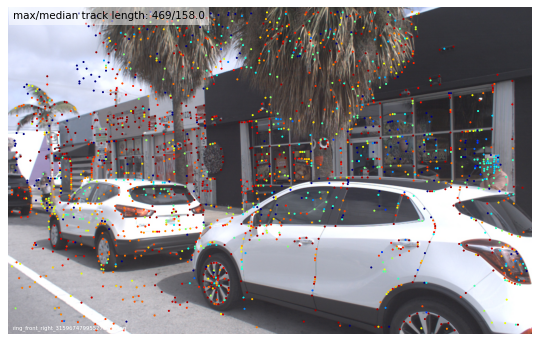

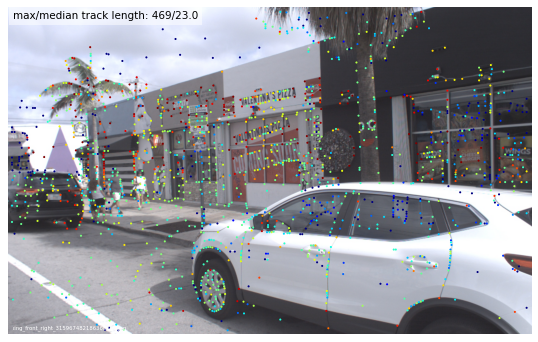

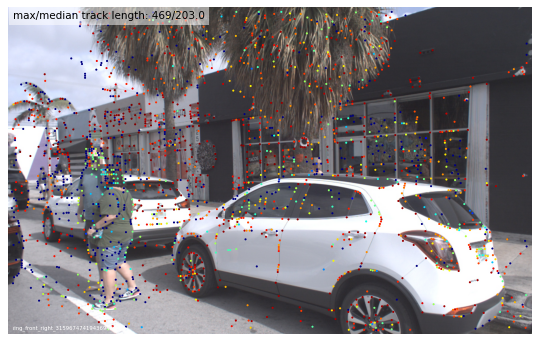

...

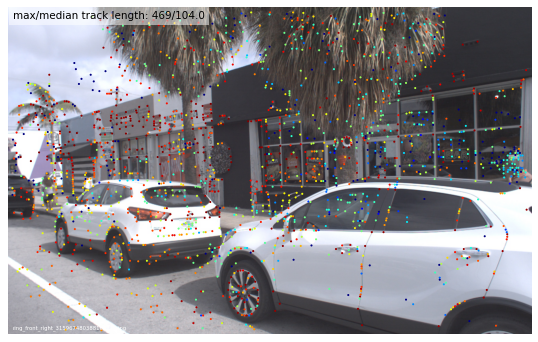

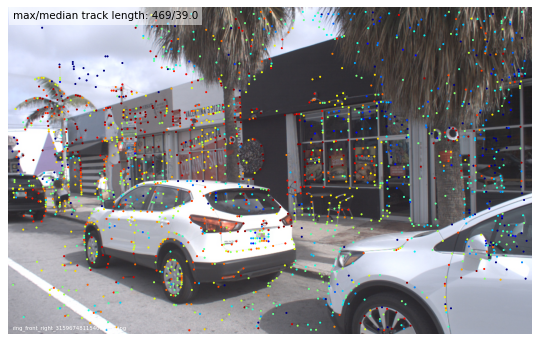

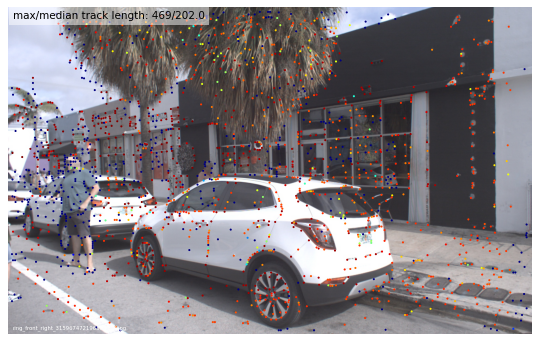

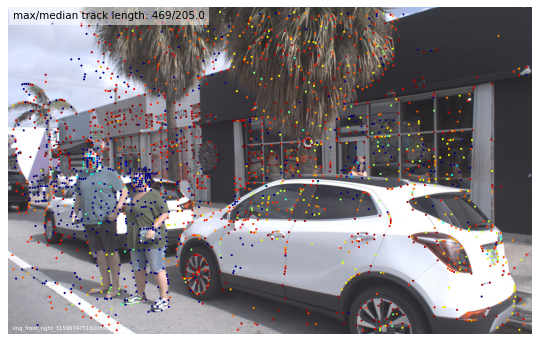

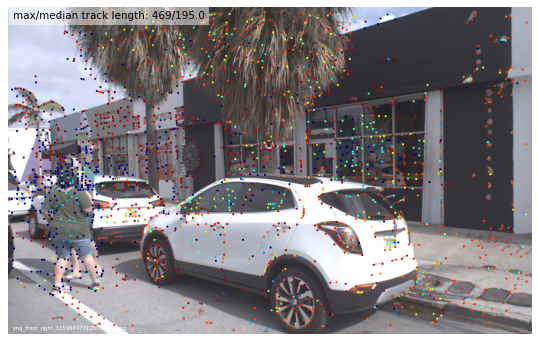

In [8]:
visualization.visualize_sfm_2d(sfm_dir / 'models/0', images, color_by='track_length', n=15)

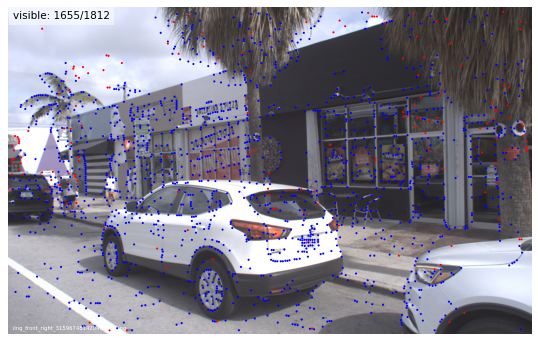

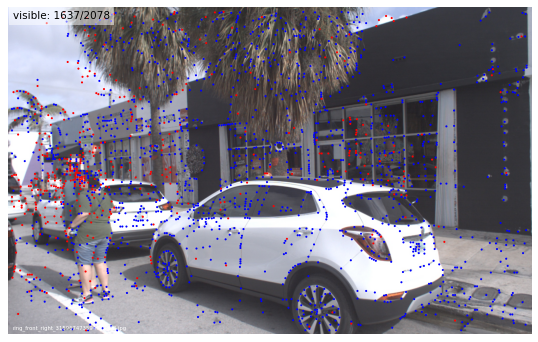

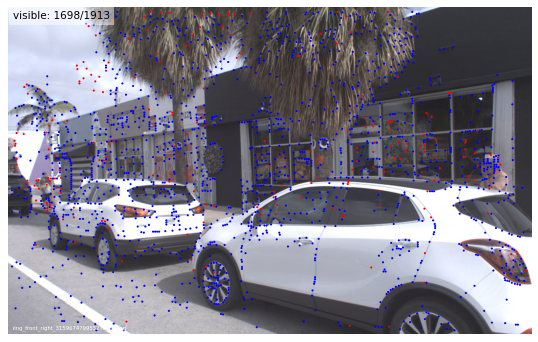

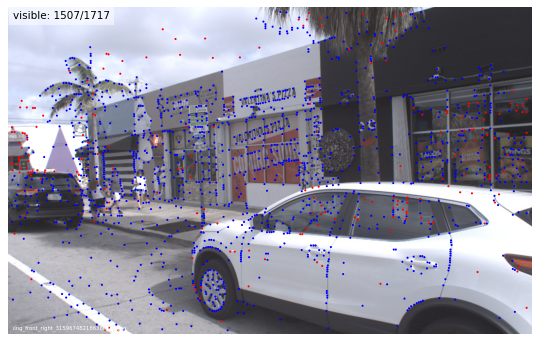

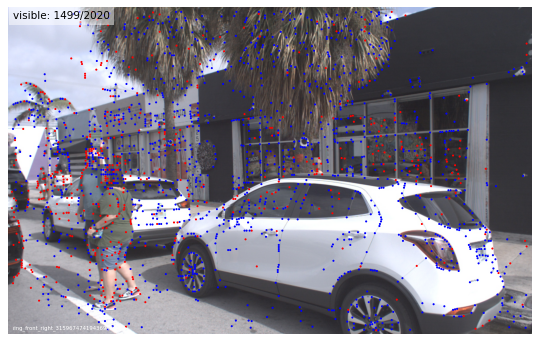

...

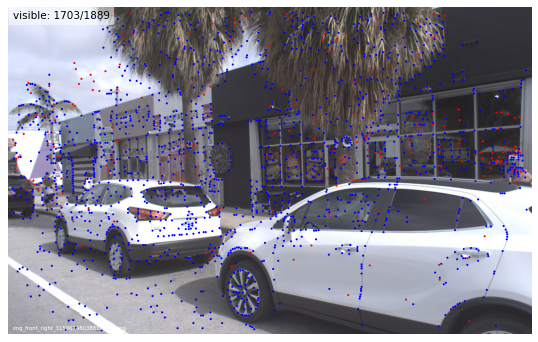

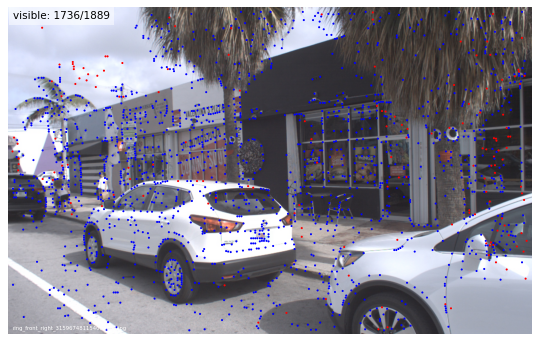

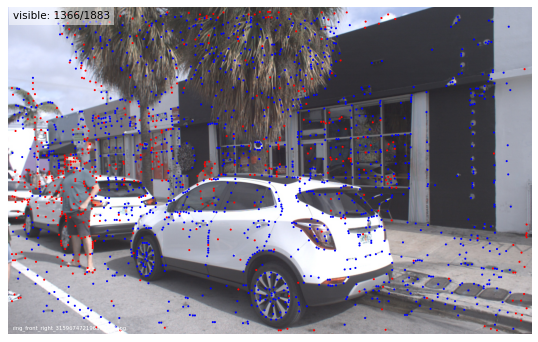

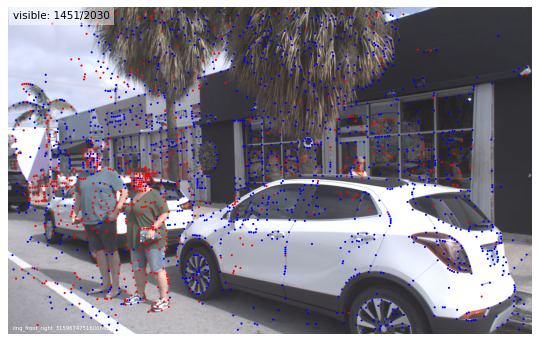

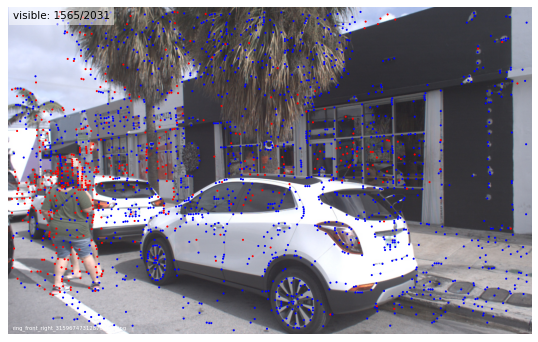

In [9]:
visualization.visualize_sfm_2d(sfm_dir / 'models/0', images, color_by='visibility', n=15)

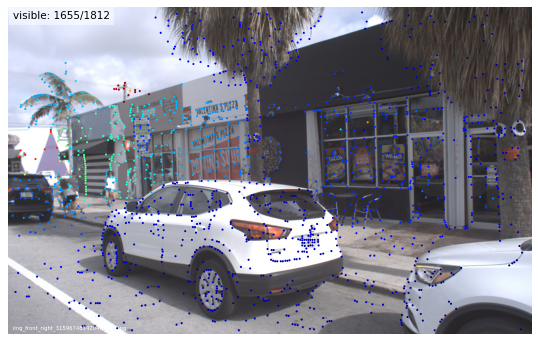

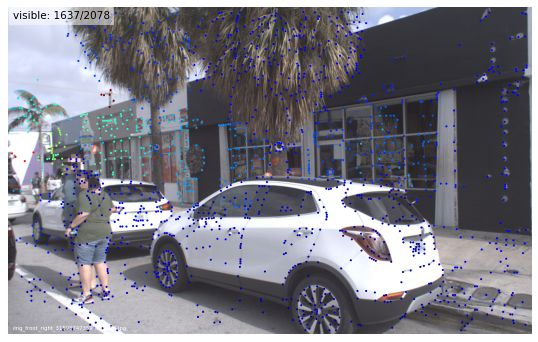

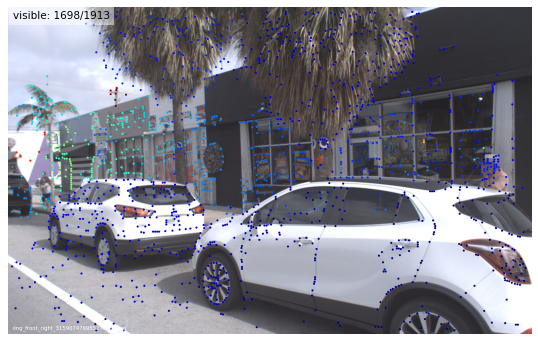

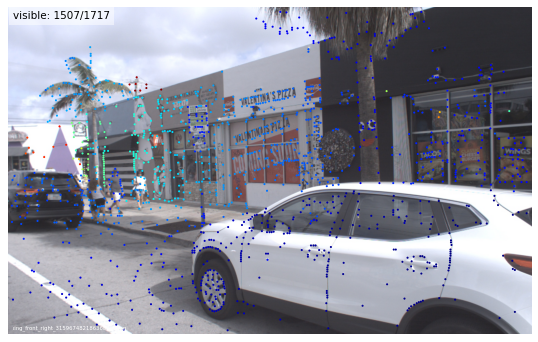

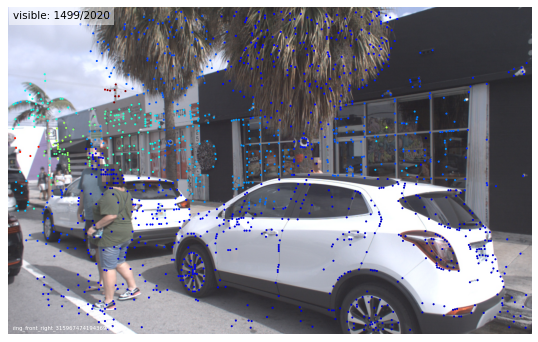

...

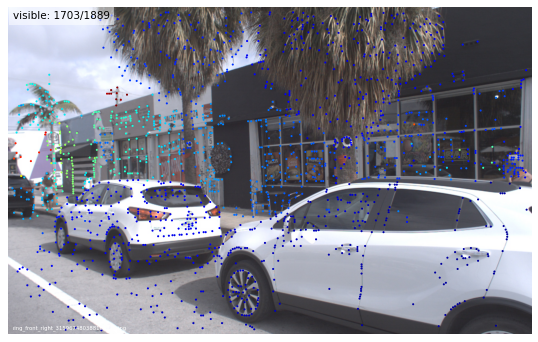

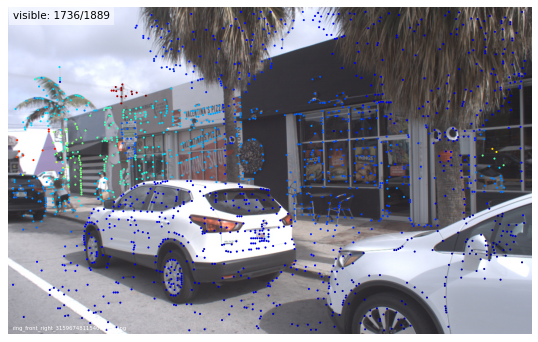

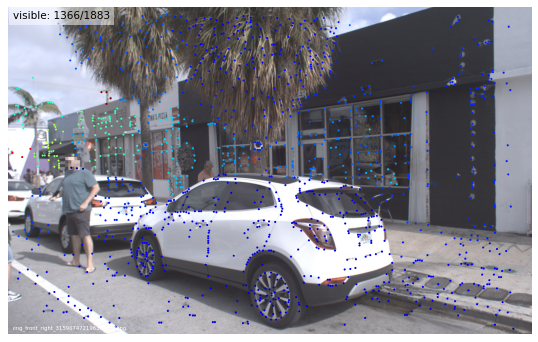

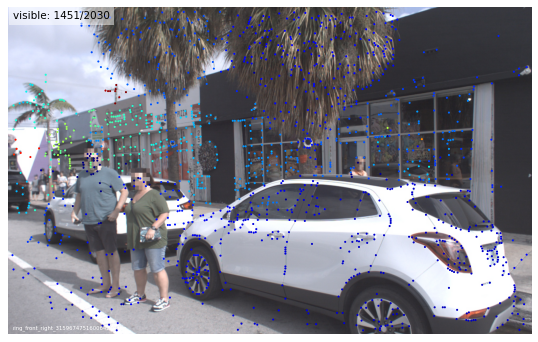

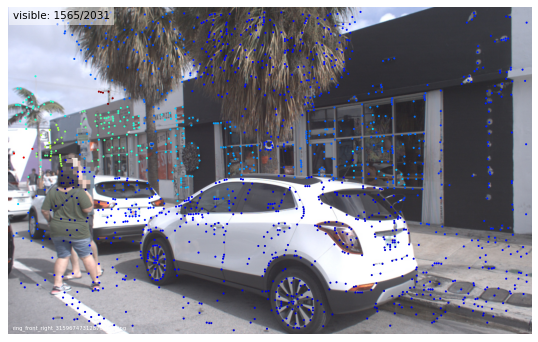

In [10]:
visualization.visualize_sfm_2d(sfm_dir / 'models/0', images, color_by='depth', n=15)